# Using `geom_imshow()` to draw DEM on map

[SRTM1N00E012V3](https://earthexplorer.usgs.gov/scene/metadata/full/5e83a3ee1af480c5/SRTM1N00E012V3/) courtesy of the U.S. Geological Survey

In [1]:
import numpy as np
from PIL import Image

from lets_plot import *
from lets_plot.geo_data import *

The geodata is provided by © OpenStreetMap contributors and is made available here under the Open Database License (ODbL).


In [2]:
LetsPlot.setup_html()

In [3]:
def get_dem_data(url):
    import requests
    from osgeo import gdal
    r = requests.get(url)
    vsipath = '/vsimem/dem'
    gdal.FileFromMemBuffer(vsipath, r.content)
    return gdal.Open(vsipath)

In [4]:
plot_size = 600
subplot_size = 500

In [5]:
# Data from geocoding
states = geocode_states().scope("Gabon").inc_res(4).get_boundaries()
cities = geocode_cities().scope("Gabon").get_centroids()

In [6]:
# Data from DEM
dataset = get_dem_data("https://raw.githubusercontent.com/JetBrains/lets-plot-docs/master/data/ivindo_river.tif")
dataset_array = dataset.ReadAsArray()
transform = dataset.GetGeoTransform()
lon_min = transform[0]
lon_max = lon_min + (transform[1] * dataset_array.shape[1])
lat_max = transform[3]
lat_min = lat_max + (transform[5] * dataset_array.shape[0])

/Users/earkhipova/Applications/miniconda3/envs/lets-plot-examples/lib/python3.10/site-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(



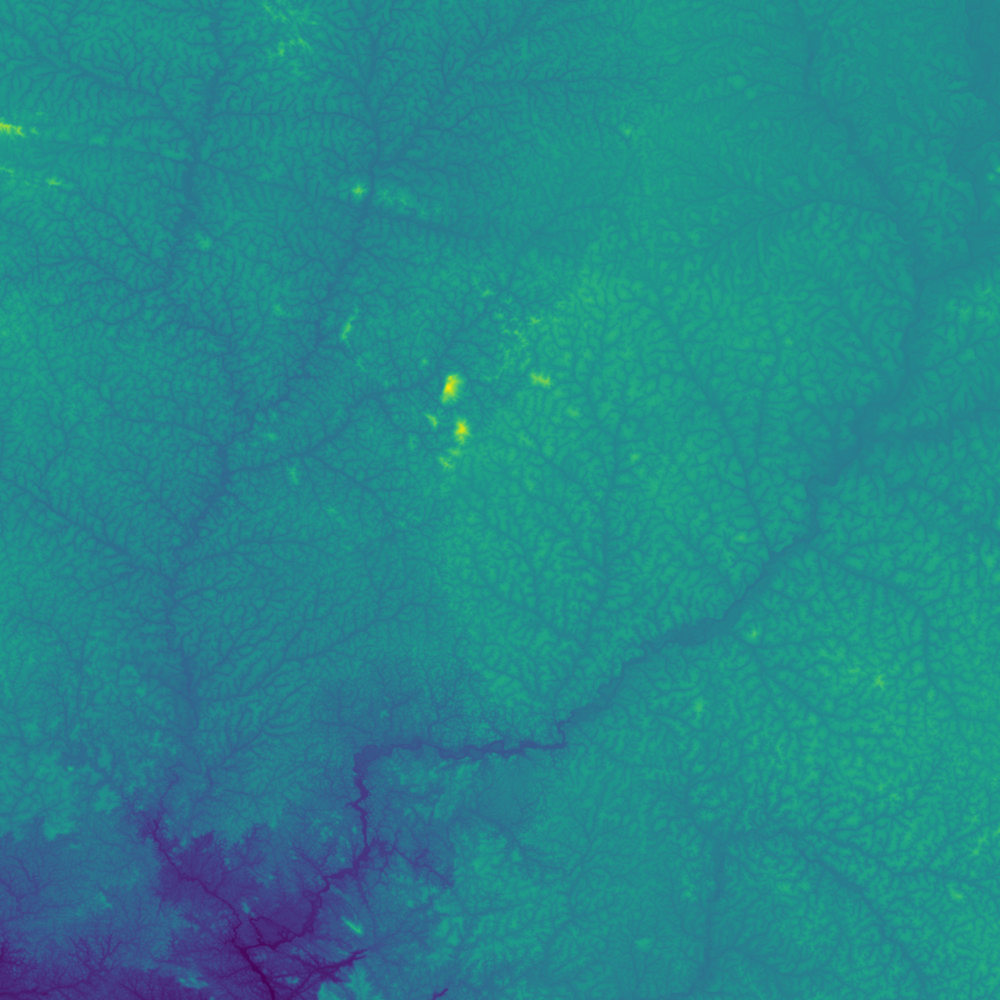

In [7]:
plot = ggplot() + \
    geom_imshow(dataset_array, extent=[lon_min, lon_max, lat_min, lat_max], cmap="viridis") + \
    geom_map(data=states, color="black", alpha=0) + \
    geom_point(data=cities, shape=21, size=4, color="black", fill="white", \
               tooltips=layer_tooltips().line("@{found name}")) + \
    ggsize(plot_size, plot_size) + \
    theme_void()
plot + ggtitle("Ivindo river in Gabon")

In [8]:
# Data from image
image_array = np.asarray(Image.open("images/ivindo_river_osm_screen.png"))


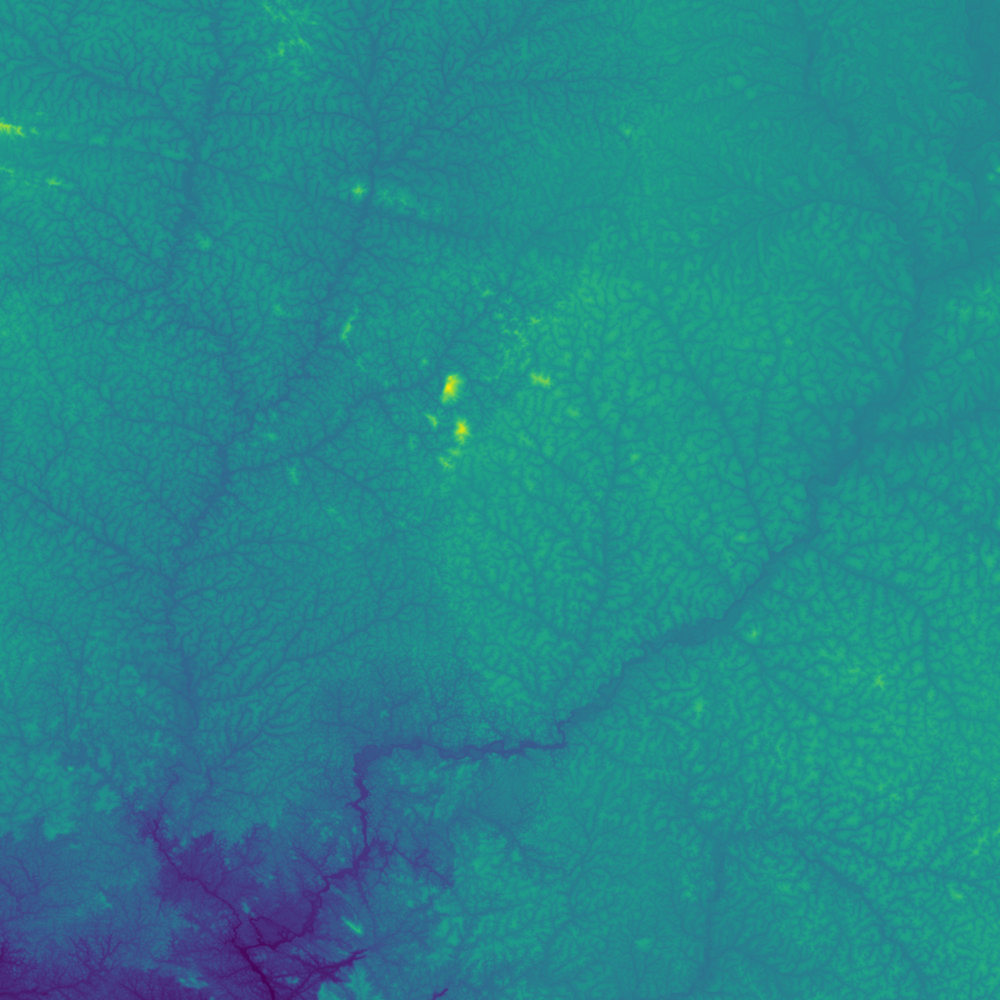
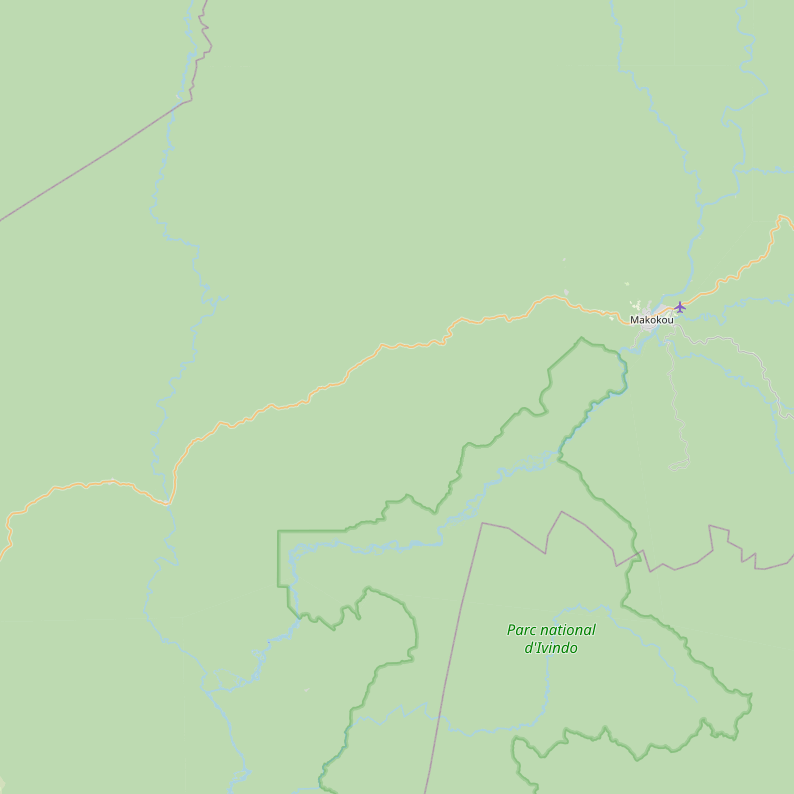

In [9]:
plot += coord_map(xlim=[lon_min, lon_max], ylim=[lat_min, lat_max]) + \
    ggtitle("Plot")
image = ggplot() + \
    geom_imshow(image_array) + \
    ggsize(plot_size, plot_size) + \
    ggtitle("Image") + \
    theme_void()

bunch = GGBunch()
bunch.add_plot(plot, 0, 0, subplot_size, subplot_size)
bunch.add_plot(image, subplot_size, 0, subplot_size, subplot_size)
bunch.show()